## Pre-processameto de imagens antes de ser aplicado o OCR

##### Fonte: [tutorial 1-9](https://www.youtube.com/watch?v=ADV-AjAXHdc&ab_channel=PythonTutorialsforDigitalHumanities), [tutorial 10](https://www.youtube.com/watch?v=4uWp6dS6_G4&ab_channel=PythonTutorialsforDigitalHumanities), [tutorial: bounding boxes](https://www.youtube.com/watch?v=9FCw1xo_s0I&t=49s&ab_channel=PythonTutorialsforDigitalHumanities)

In [1]:
# Importação de bibliotecas:

import cv2
import PIL
import pytesseract
import numpy as np
import matplotlib.pyplot as plt
from pdf2image import convert_from_path
from PIL import Image, ImageDraw

### 1. Abrindo um pdf e salvando em formato .jpg: (se fosse o caso)

#### Leitura e visualização do documento em pdf:

doc = convert_from_path(pdf_path = 'images/doc_exemplo.pdf',
                            dpi = 500, fmt = 'jpg', hide_annotations = True)

#### Salvando a imagem (.jpg) em um novo arquivo:

doc_pag1 = doc[0]
doc_pag1.save('images/doc_pag1.jpg')

### 2. Abrindo a imagem salva com o OpenCv:

In [2]:
caminho_imagem = 'images/exemplo.jpg'

ex = cv2.imread(caminho_imagem)

In [3]:
# Função para mostrar a imagem no seu tamanho original com o matplotlib:

def display(im_path):
    dpi = 80
    im_data = plt.imread(im_path)

    height, width  = im_data.shape[:2]
    
    # What size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi), height / float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image.
    ax.imshow(im_data, cmap='gray')

    plt.show()

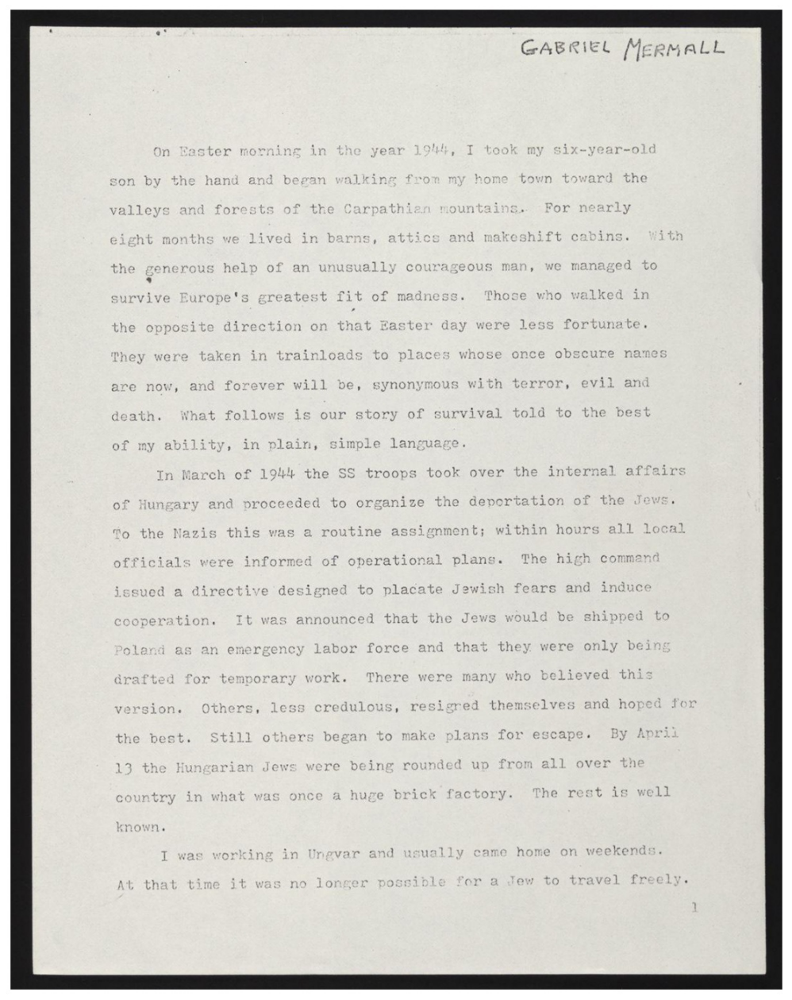

In [4]:
display(caminho_imagem)

### 3. Inverted images: o que é claro se torna escuro e vice-versa.

#### Esse nao é um passo fundamental para o processo, mas às vezes pode ser necessário.

In [5]:
ex_invertido = cv2.bitwise_not(ex)
cv2.imwrite('images/ex_invertido.jpg', ex_invertido)

True

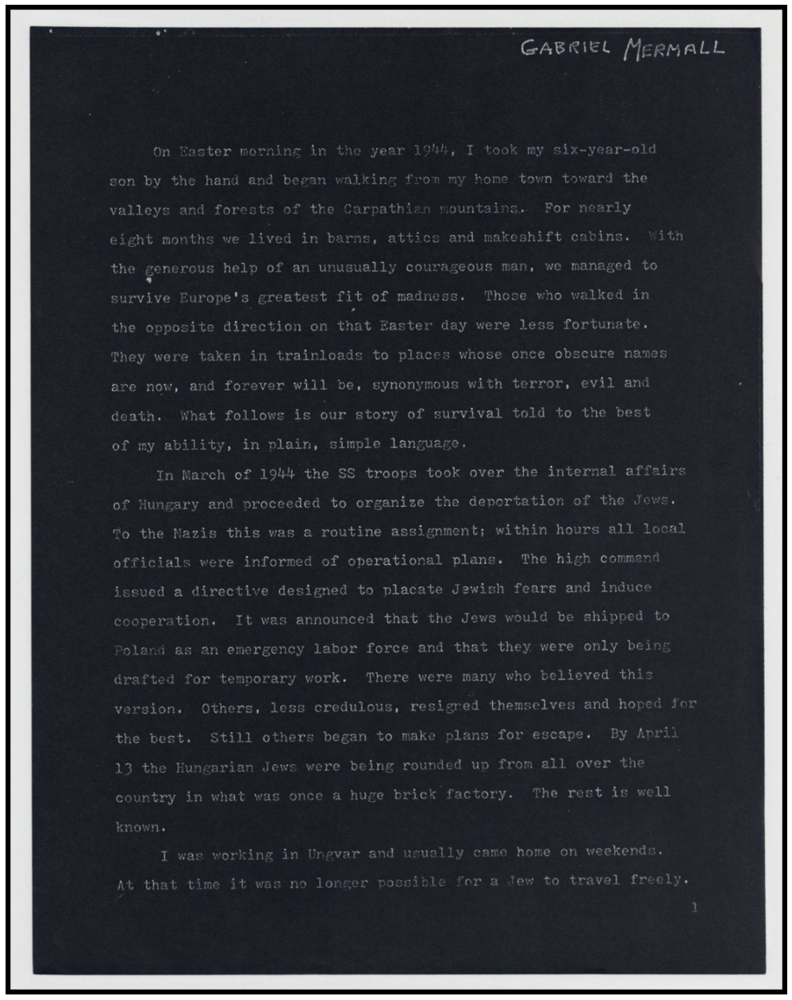

In [6]:
display('images/ex_invertido.jpg')

### 4. Binarização:

#### 4.1 Escala de cinza:

In [7]:
# Antes de realizar a binarização, passaremos a imagem para a escala de cinzas:

def cinza(img):
    return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

In [8]:
# Utilizando a função para a conversão:

ex_cinza = cinza(ex)

# Salvando a imagem:

cv2.imwrite('images/ex_cinza.jpg', ex_cinza)

True

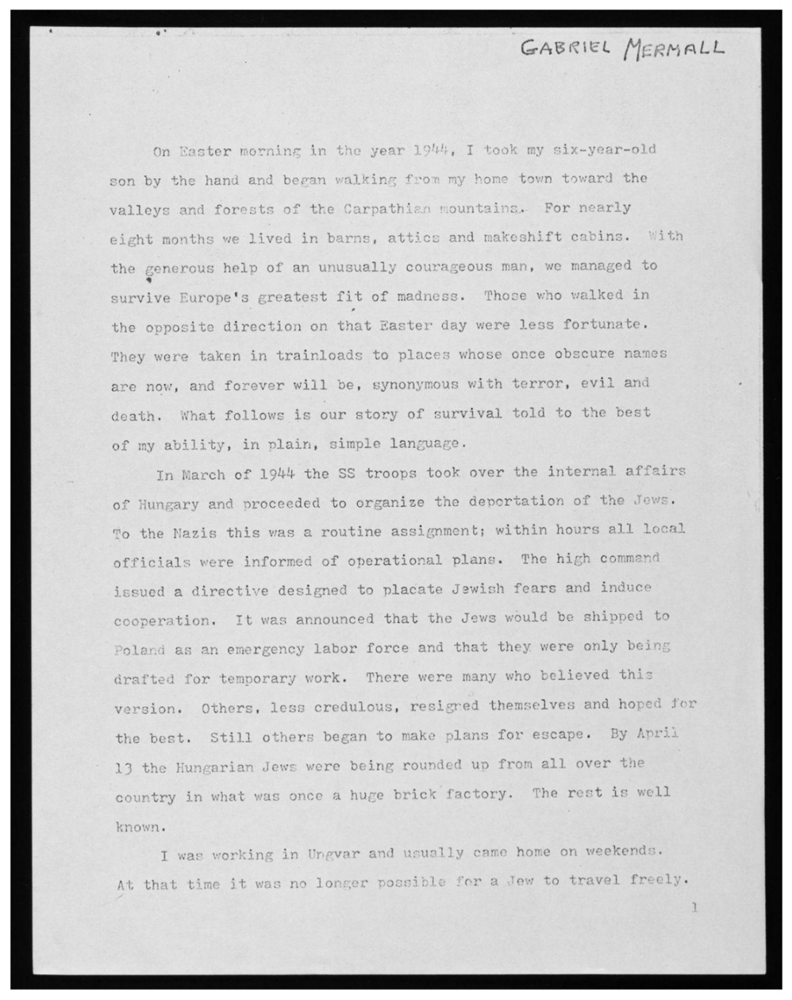

In [9]:
# Utilizando a função display para mostrar a imagem:

display('images/ex_cinza.jpg')

#### 4.2 Binarização:

In [10]:
# Binarização

thresh, ex_bw = cv2.threshold(ex_cinza, 210,230, cv2.THRESH_BINARY)

# Salvando a imagem:
cv2.imwrite('images/ex_bw.jpg', ex_bw)

True

##### Alterar os parâmetros 200, 230 mexe no contraste da imagem.

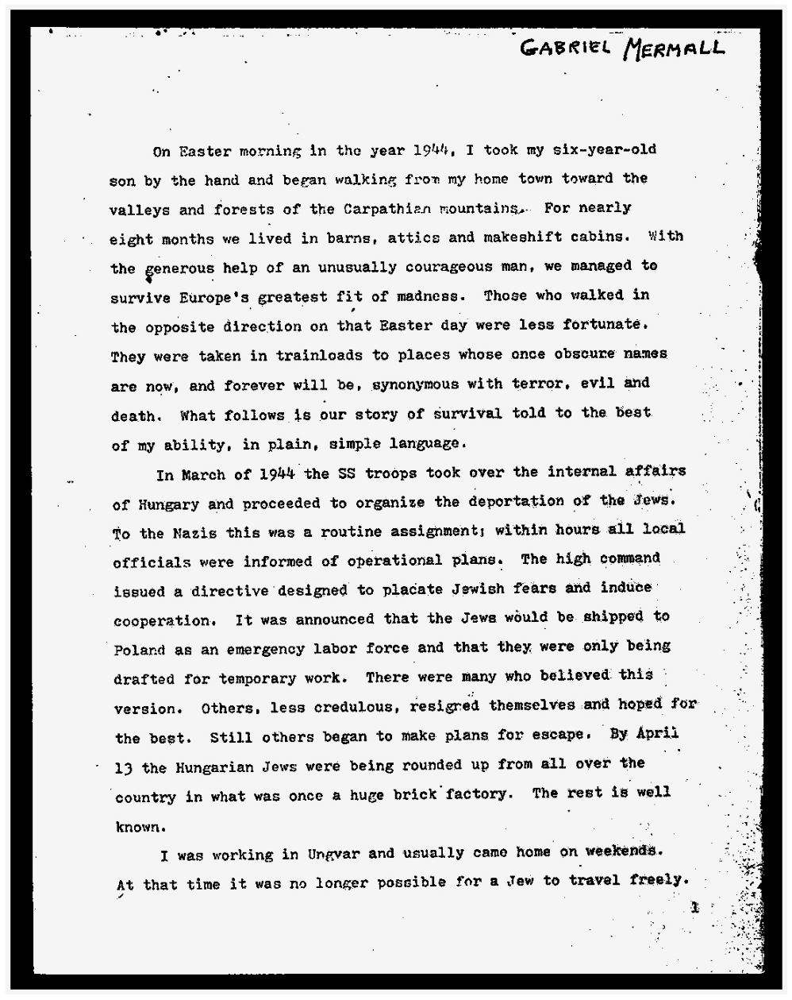

In [11]:
# Utilizando a função display para mostrar a imagem:

display('images/ex_bw.jpg')

### 5. Remoção de ruídos:

#### Nem sempre é vantajoso usar, pode reduzir a nitidez dos caracteres. Analisar caso a caso.

In [12]:
def remover_ruido(image):
    kernel = np.ones((1, 1), np.uint8)
    image = cv2.dilate(image, kernel, iterations=1)
    kernel = np.ones((1, 1), np.uint8)
    image = cv2.erode(image, kernel, iterations=1)
    image = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)
    image = cv2.medianBlur(image, 3)
    return (image)

In [13]:
# Utilizando a função de remoção de ruídos na imagem bw:

ex_sem_ruido = remover_ruido(ex_bw)

# Salvando a nova imagem:

cv2.imwrite('images/ex_sem_ruido.jpg', ex_sem_ruido)

True

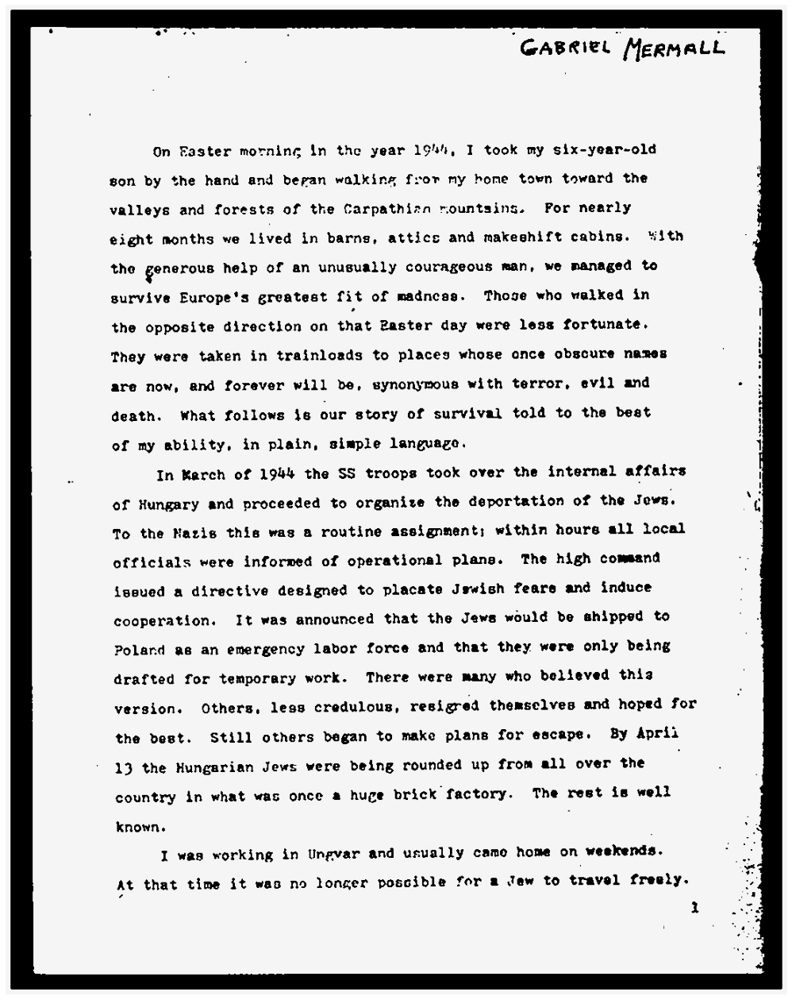

In [14]:
# Mostrando a imagem:

display('images/ex_sem_ruido.jpg')

### 6. Dilatação e erosão:

#### 6.1 Fonte fina:

In [15]:
def fonte_fina(image):
    image = cv2.bitwise_not(image) # Inversão (preto e branco)
    kernel = np.ones((2,2),np.uint8)
    image = cv2.erode(image, kernel, iterations=1)
    image = cv2.bitwise_not(image) # Invertendo novamente (ou seja, revertendo)
    return (image)

In [16]:
# Utilizando a função na imagem resultante da redução de ruído:

ex_fonte_fina = fonte_fina(ex_sem_ruido)
cv2.imwrite('images/ex_fonte_fina.jpg', ex_fonte_fina)

True

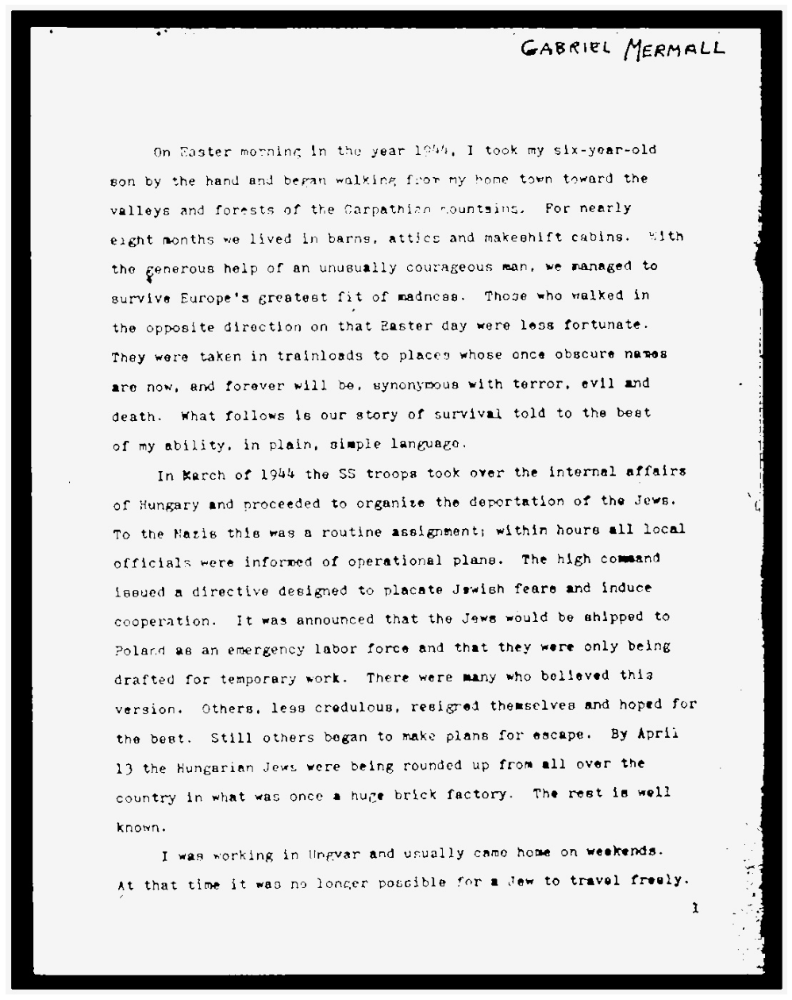

In [17]:
# Mostrando a imagem:

display('images/ex_fonte_fina.jpg')

#### 6.2 Fonte espessa:

In [18]:
def fonte_espessa(image):
    import numpy as np
    image = cv2.bitwise_not(image)
    kernel = np.ones((2,2),np.uint8)
    image = cv2.dilate(image, kernel, iterations=1)
    image = cv2.bitwise_not(image)
    return (image)

In [19]:
ex_fonte_espessa = fonte_espessa(ex_sem_ruido)
cv2.imwrite("images/ex_fonte_espessa.jpg", ex_fonte_espessa)

True

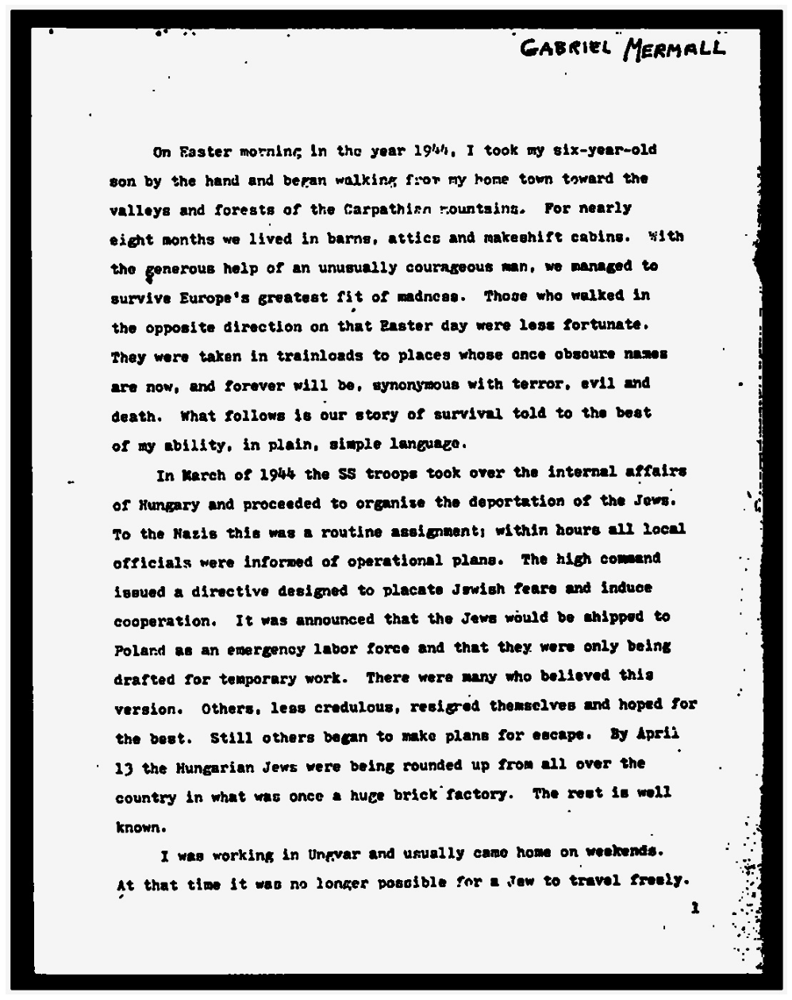

In [20]:
display("images/ex_fonte_espessa.jpg")

### 7. Rotação / Alinhamento:

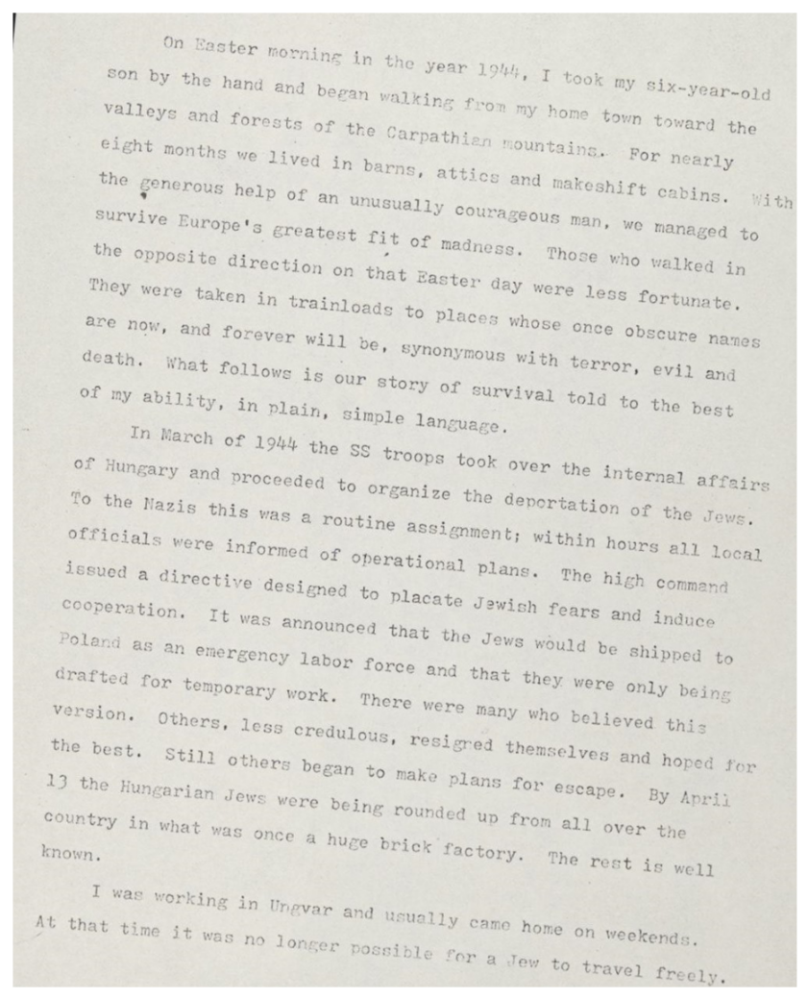

In [21]:
ex2 = cv2.imread("images/ex2.jpg")
display("images/ex2.jpg")

In [22]:
def getSkewAngle(cvImage) -> float:
    # Prep image, copy, convert to gray scale, blur, and threshold
    newImage = cvImage.copy()
    gray = cv2.cvtColor(newImage, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (9, 9), 0)
    thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

    # Apply dilate to merge text into meaningful lines/paragraphs.
    # Use larger kernel on X axis to merge characters into single line, cancelling out any spaces.
    # But use smaller kernel on Y axis to separate between different blocks of text
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (30, 5))
    dilate = cv2.dilate(thresh, kernel, iterations=2)

    # Find all contours
    contours, hierarchy = cv2.findContours(dilate, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key = cv2.contourArea, reverse = True)
    for c in contours:
        rect = cv2.boundingRect(c)
        x,y,w,h = rect
        cv2.rectangle(newImage,(x,y),(x+w,y+h),(0,255,0),2)

    # Find largest contour and surround in min area box
    largestContour = contours[0]
    print (len(contours))
    minAreaRect = cv2.minAreaRect(largestContour)
    cv2.imwrite("temp/boxes.jpg", newImage)
    # Determine the angle. Convert it to the value that was originally used to obtain skewed image
    angle = minAreaRect[-1]
    if angle < -45:
        angle = 90 + angle
    return -1.0 * angle
# Rotate the image around its center
def rotateImage(cvImage, angle: float):
    newImage = cvImage.copy()
    (h, w) = newImage.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    newImage = cv2.warpAffine(newImage, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    return newImage


In [23]:
# Deskew image
def deskew(cvImage):
    angle = getSkewAngle(cvImage)
    return rotateImage(cvImage, -1.0 * angle)

In [24]:
ex2_alinhada = deskew(ex2)
cv2.imwrite("images/ex2_alinhada.jpg", ex2_alinhada)

28


True

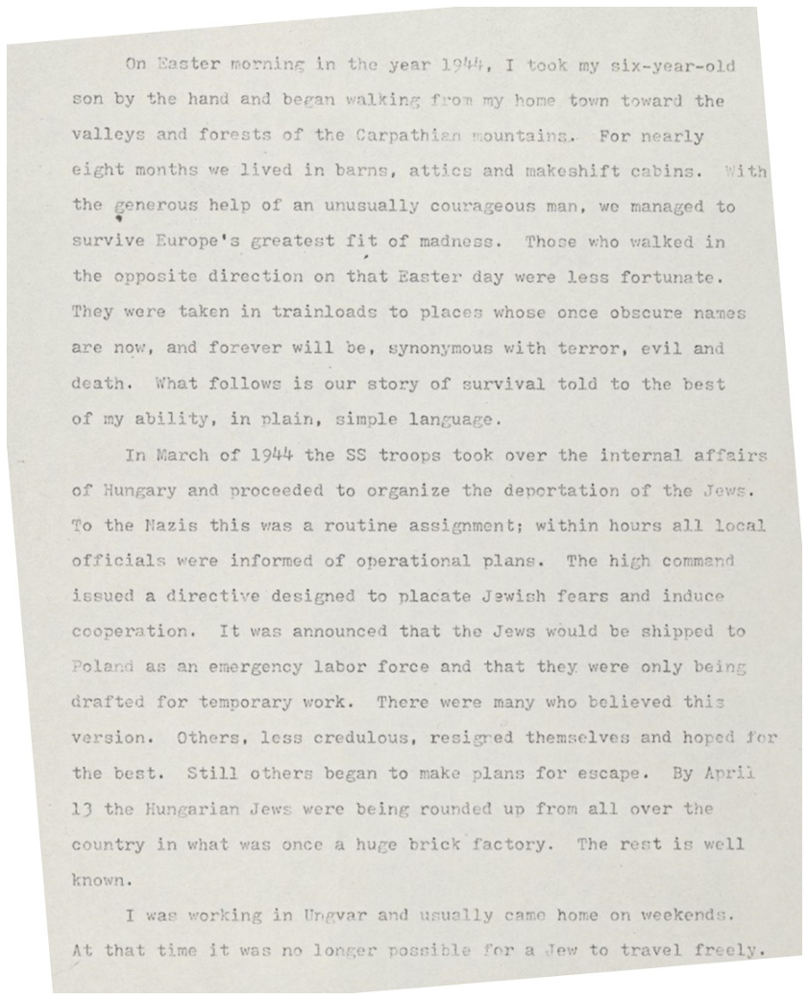

In [25]:
display("images/ex2_alinhada.jpg")

### 8. Remoção de bordas:

In [26]:
def remove_borders(image):
    contours, heiarchy = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cntsSorted = sorted(contours, key=lambda x:cv2.contourArea(x))
    cnt = cntsSorted[-1]
    x, y, w, h = cv2.boundingRect(cnt)
    crop = image[y:y+h, x:x+w]
    return (crop)

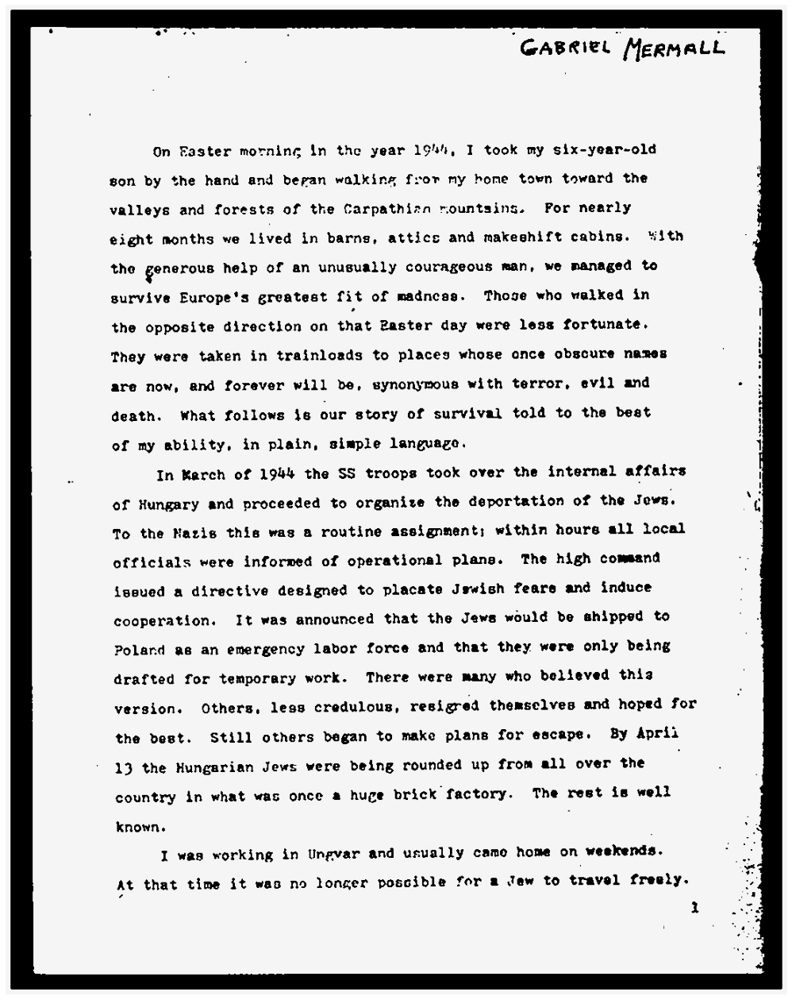

In [27]:
# Utilizando a função com a imagem sem ruídos:

no_borders = remove_borders(ex_sem_ruido)
cv2.imwrite("images/no_borders.jpg", no_borders)
display('images/no_borders.jpg')

### 9. Bordas faltantes:

In [28]:
color = [255, 255, 255] # Cor branca
top, bottom, left, right = [150]*4

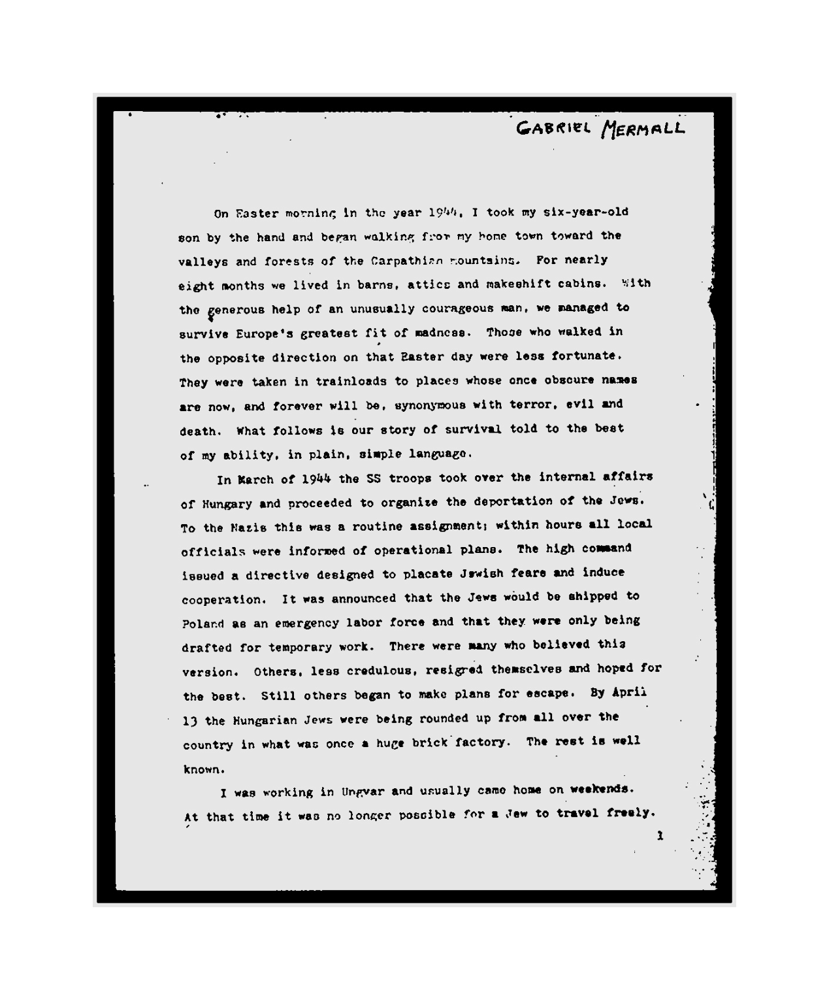

In [29]:
image_with_border = cv2.copyMakeBorder(no_borders, top, bottom, left, right, cv2.BORDER_CONSTANT, value=color)
cv2.imwrite("images/image_with_border.jpg", image_with_border)
display("images/image_with_border.jpg")

### 10. Tesseract:

In [30]:
import pytesseract
from PIL import Image

In [31]:
# O arquivo a ser utilizado será o "ex_sem_ruido":

img = 'images/ex_sem_ruido.jpg'

# Utilizando o PILLOW para abrir a imagem:

ex_sem_ruido = Image.open(img)

In [32]:
# Utilizando o TESSERACT para realizar o OCR no arquivo:

ex_sem_ruido_ocr = pytesseract.image_to_string(ex_sem_ruido)
print(ex_sem_ruido_ocr)

“GaBaiel Mermatl

On Easter morning in the year 1944, I took my six-year-old
son by the hand and beran walking fror my home town toward the
valleys and forests of the Carpathian mountains, For nearly
eight months we lived in barns, attics and makeehift cabins. ‘with
the generous help of an unusually courageous man, we managed to
survive Europe's greatest fit of madncas. Those who walked in
the opposite direction on that Baster day were less fortunate,
They were taken in trainloads to places whose once obscure naxes
are now, and forever will be, synonymous with terror, evil and
death. What follows i6 our story of survival told to the best
of my ability, in plain, simple language.

In March of 194% the SS troops tock over the internal affairs
of Hungary and proceeded to organize the deportation of the Jews.
To the Nazis thie was a routine assignment; within hours all iocal
officials were informed of operational plans. The high comeand
{geued a directive designed to placate Jewish feare a

### 11. Bounding Boxes:

#### Filtros para preparação da imagem para os bounding boxes:

> Objetivo: identificar estruturas no texto.

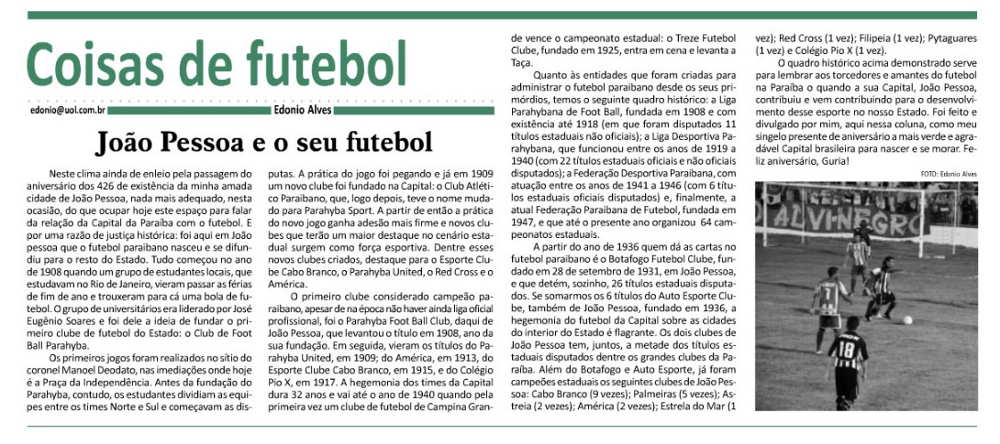

In [35]:
# Lendo uma imagem:

texto_colunas = cv2.imread("images/texto_colunas.jpg")
display("images/texto_colunas.jpg")

In [36]:
# Convertendo a imagem para a escala de cinza:

texto_colunas_cinza = cinza(texto_colunas)

In [37]:
# Aplicando o filtro BLUR na imagem em escala de cinza:

texto_colunas_cinza_BLUR = cv2.GaussianBlur(texto_colunas_cinza, (7,7), 0)
cv2.imwrite('images/texto_colunas_cinza_BLUR.jpg', texto_colunas_cinza_BLUR)

True

In [38]:
# THRESH:

texto_colunas_cinza_BLUR_THRESH = cv2.threshold(texto_colunas_cinza_BLUR, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

In [40]:
cv2.imwrite('images/texto_colunas_cinza_BLUR_THRESH.jpg', texto_colunas_cinza_BLUR_THRESH)

True

In [41]:
# Kernel:

texto_colunas_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3,13))
cv2.imwrite('images/texto_colunas_kernel.jpg', texto_colunas_kernel)

True

In [43]:
# Dilatar:

texto_colunas_dilatar = cv2.dilate(texto_colunas_cinza_BLUR_THRESH, texto_colunas_kernel, iterations = 1)
cv2.imwrite('images/texto_colunas_dilatar.jpg', texto_colunas_dilatar)

True

In [44]:
# Contornos:

contornos = cv2.findContours(texto_colunas_dilatar, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

In [45]:
contornos = contornos[0] if len(contornos) == 2 else contornos[1]
contornos = sorted(contornos, key = lambda x: cv2.boundingRect(x)[0]) # Organizar os contornos

In [48]:
for c in contornos:
    x, y, w, h = cv2.boundingRect(c)
    if h > 200 and w > 20:
        #roi = texto_colunas[y:y+h, x:x+h]
        #cv2.imwrite('images/texto_colunas_roi.jpg', roi) # Salva as rois separadamente
        cv2.rectangle(texto_colunas, (x,y), (x + w, y + h), (36, 255, 12), 2)
    
cv2.imwrite('images/texto_colunas_bbox.jpg', texto_colunas)   

True

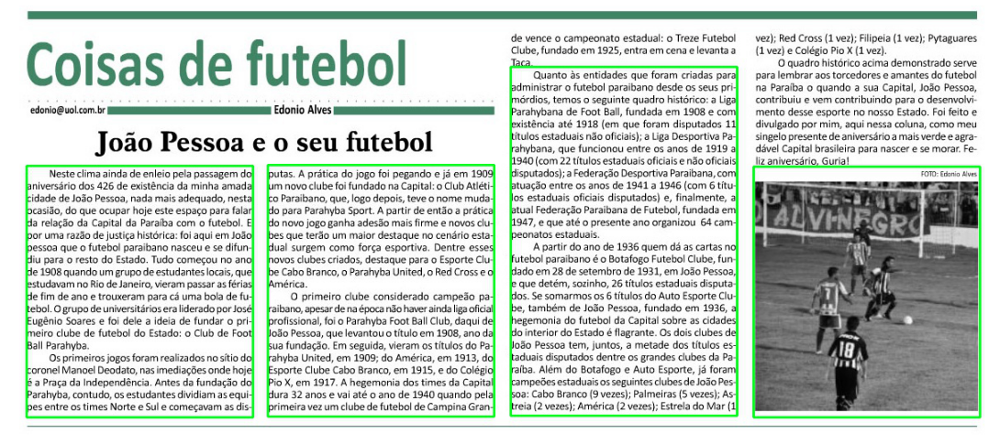

In [49]:
# Visualizando:

display('images/texto_colunas_bbox.jpg')